# Beijing air quality data

In [1]:
import download

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

from datetime import datetime 

from download import download

mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['axes.grid'] = False

In [3]:
path = download('https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip', 'AirQualityData',  kind="zip")

Replace is False and data exists, so doing nothing. Use replace=True to re-download the data.


In [4]:
filepath='AirQualityData/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv'

**The encoding parameter specifies how the bytes in the file should be decoded into text. Different encodings represent characters using different byte sequences.**

Other encoders `UTF-8 (Unicode Transformation Format - 8-bit)` is a variable-width character encoding standard for encoding Unicode characters. It is one of the most commonly used character encodings on the internet and in computing in general.

In [5]:
df = pd.read_csv(filepath, encoding='ISO-8859-1')
df

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,35060,2017,2,28,19,11.0,11.0,2.0,2.0,200.0,99.0,11.7,1008.9,-13.3,0.0,NNE,1.3,Dingling
35060,35061,2017,2,28,20,13.0,13.0,2.0,2.0,200.0,101.0,10.9,1009.0,-14.0,0.0,N,2.1,Dingling
35061,35062,2017,2,28,21,9.0,14.0,2.0,2.0,200.0,102.0,9.5,1009.4,-13.0,0.0,N,1.5,Dingling
35062,35063,2017,2,28,22,10.0,12.0,2.0,2.0,200.0,97.0,7.8,1009.6,-12.6,0.0,NW,1.4,Dingling


In [6]:
df.isnull().sum()

No            0
year          0
month         0
day           0
hour          0
PM2.5       779
PM10        656
SO2         730
NO2        1234
CO         2012
O3         1214
TEMP         53
PRES         50
DEWP         53
RAIN         51
wd          140
WSPM         43
station       0
dtype: int64

In [7]:
def convert_to_date(x):
    return datetime.strptime(x, '%Y %m %d %H')

In [8]:
aq_df = pd.read_csv(filepath, parse_dates = [[ 'year', 'month', 'day', 'hour']] , date_parser = convert_to_date, keep_date_col = True)

/var/folders/vd/7kcv0wsd01qflzy6p6wd496h0000gn/T/ipykernel_12134/1728411038.py:1: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  aq_df = pd.read_csv(filepath, parse_dates = [[ 'year', 'month', 'day', 'hour']] , date_parser = convert_to_date, keep_date_col = True)


In [9]:
aq_df

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,2017-02-28 19:00:00,35060,2017,2,28,19,11.0,11.0,2.0,2.0,200.0,99.0,11.7,1008.9,-13.3,0.0,NNE,1.3,Dingling
35060,2017-02-28 20:00:00,35061,2017,2,28,20,13.0,13.0,2.0,2.0,200.0,101.0,10.9,1009.0,-14.0,0.0,N,2.1,Dingling
35061,2017-02-28 21:00:00,35062,2017,2,28,21,9.0,14.0,2.0,2.0,200.0,102.0,9.5,1009.4,-13.0,0.0,N,1.5,Dingling
35062,2017-02-28 22:00:00,35063,2017,2,28,22,10.0,12.0,2.0,2.0,200.0,97.0,7.8,1009.6,-12.6,0.0,NW,1.4,Dingling


In [10]:
aq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   year_month_day_hour  35064 non-null  datetime64[ns]
 1   No                   35064 non-null  int64         
 2   year                 35064 non-null  object        
 3   month                35064 non-null  object        
 4   day                  35064 non-null  object        
 5   hour                 35064 non-null  object        
 6   PM2.5                34285 non-null  float64       
 7   PM10                 34408 non-null  float64       
 8   SO2                  34334 non-null  float64       
 9   NO2                  33830 non-null  float64       
 10  CO                   33052 non-null  float64       
 11  O3                   33850 non-null  float64       
 12  TEMP                 35011 non-null  float64       
 13  PRES                 35014 non-

**NOTE: going from df to aq_df_, the day, month, year, hour got converted from int to object** 

In [11]:
aq_df['month'] = pd.to_numeric(aq_df['month'])

In [12]:
aq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   year_month_day_hour  35064 non-null  datetime64[ns]
 1   No                   35064 non-null  int64         
 2   year                 35064 non-null  object        
 3   month                35064 non-null  int64         
 4   day                  35064 non-null  object        
 5   hour                 35064 non-null  object        
 6   PM2.5                34285 non-null  float64       
 7   PM10                 34408 non-null  float64       
 8   SO2                  34334 non-null  float64       
 9   NO2                  33830 non-null  float64       
 10  CO                   33052 non-null  float64       
 11  O3                   33850 non-null  float64       
 12  TEMP                 35011 non-null  float64       
 13  PRES                 35014 non-

In [13]:
aq_df.describe()

,year_month_day_hour,No,month,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064,35064.000000,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,2015-03-01 11:30:00,17532.500000,6.522930,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
min,2013-03-01 00:00:00,1.000000,1.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,2014-03-01 05:45:00,8766.750000,4.000000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,2015-03-01 11:30:00,17532.500000,7.000000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,2016-02-29 17:15:00,26298.250000,10.000000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,2017-02-28 23:00:00,35064.000000,12.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000
std,NaN,10122.249256,3.448752,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808


In [14]:
aq_df_non_indexed = aq_df.copy()

In [15]:
aq_df = aq_df.set_index('year_month_day_hour')

**Making 'year_month_day_hour' as index allows us to provides fast and intuitive indexing and selection of data based on time intervals or specific timestamps.** 
can use iloc, and other functionality

In [16]:
aq_df.index

DatetimeIndex(['2013-03-01 00:00:00', '2013-03-01 01:00:00',
               '2013-03-01 02:00:00', '2013-03-01 03:00:00',
               '2013-03-01 04:00:00', '2013-03-01 05:00:00',
               '2013-03-01 06:00:00', '2013-03-01 07:00:00',
               '2013-03-01 08:00:00', '2013-03-01 09:00:00',
               ...
               '2017-02-28 14:00:00', '2017-02-28 15:00:00',
               '2017-02-28 16:00:00', '2017-02-28 17:00:00',
               '2017-02-28 18:00:00', '2017-02-28 19:00:00',
               '2017-02-28 20:00:00', '2017-02-28 21:00:00',
               '2017-02-28 22:00:00', '2017-02-28 23:00:00'],
              dtype='datetime64[ns]', name='year_month_day_hour', length=35064, freq=None)

In [17]:
aq_df.loc['2013-03-01 00' : '2013-03-01 04']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [18]:
aq_df.loc['2014' : '2016']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2014-01-01 00:00:00,7345,2014,1,1,0,27.0,104.0,12.0,9.0,NaN,NaN,6.8,1003.7,-15.9,0.0,WSW,5.2,Dingling
2014-01-01 01:00:00,7346,2014,1,1,1,25.0,86.0,12.0,9.0,500.0,63.0,6.5,1003.6,-16.2,0.0,W,3.6,Dingling
2014-01-01 02:00:00,7347,2014,1,1,2,27.0,85.0,14.0,9.0,400.0,63.0,6.4,1003.4,-15.6,0.0,WNW,5.3,Dingling
2014-01-01 03:00:00,7348,2014,1,1,3,34.0,98.0,19.0,15.0,400.0,56.0,6.2,1002.9,-15.8,0.0,WNW,4.7,Dingling
2014-01-01 04:00:00,7349,2014,1,1,4,32.0,102.0,18.0,15.0,400.0,33.0,6.1,1002.7,-15.2,0.0,W,3.5,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 19:00:00,33644,2016,12,31,19,251.0,251.0,22.0,137.0,3800.0,3.0,-2.2,1017.0,-10.0,0.0,NNW,1.2,Dingling
2016-12-31 20:00:00,33645,2016,12,31,20,256.0,256.0,34.0,131.0,4600.0,4.0,-2.5,1017.1,-10.3,0.0,NNE,1.4,Dingling
2016-12-31 21:00:00,33646,2016,12,31,21,232.0,232.0,24.0,131.0,3600.0,2.0,-3.3,1017.2,-10.6,0.0,NNE,1.4,Dingling


In [19]:
# THIS IS THE TARGET COLUMN
pm_data = aq_df['PM2.5']
pm_data

year_month_day_hour
2013-03-01 00:00:00     4.0
2013-03-01 01:00:00     7.0
2013-03-01 02:00:00     5.0
2013-03-01 03:00:00     6.0
2013-03-01 04:00:00     5.0
                       ... 
2017-02-28 19:00:00    11.0
2017-02-28 20:00:00    13.0
2017-02-28 21:00:00     9.0
2017-02-28 22:00:00    10.0
2017-02-28 23:00:00    13.0
Name: PM2.5, Length: 35064, dtype: float64

<Axes: xlabel='year_month_day_hour'>

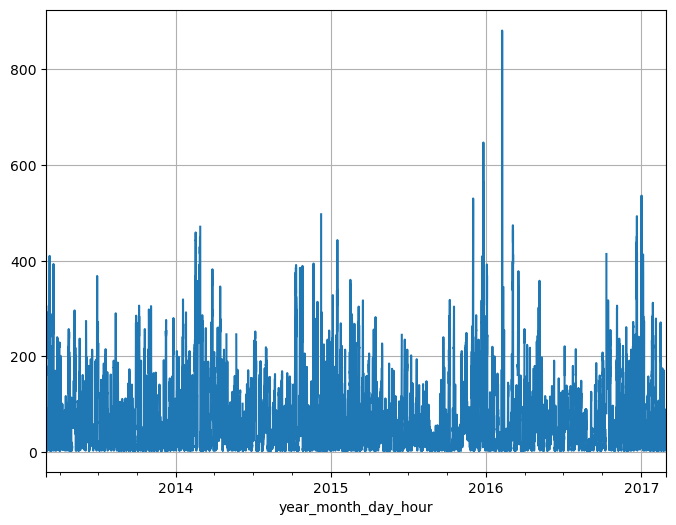

In [20]:
pm_data.plot(grid=True)

Text(0.5, 1.0, 'PM2.5 Levels in 2015')

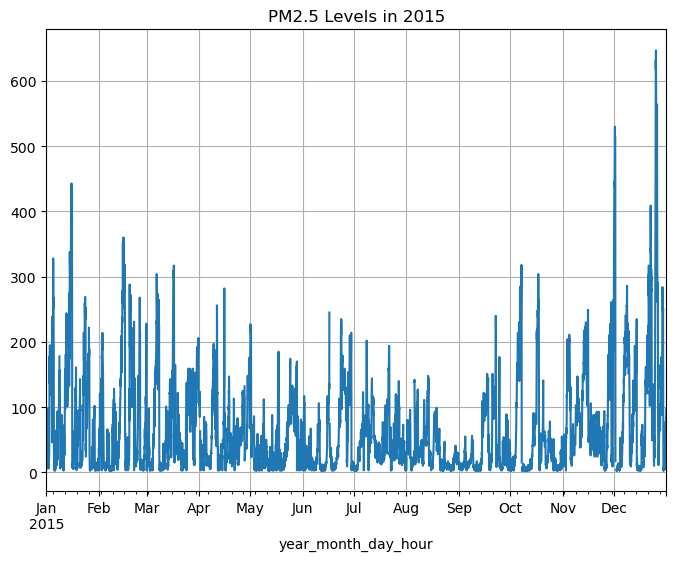

In [21]:
(aq_df['PM2.5'].loc['2015']).plot(grid=True)
plt.title('PM2.5 Levels in 2015')

Text(0.5, 1.0, 'PM 2.5 levels in 2016')

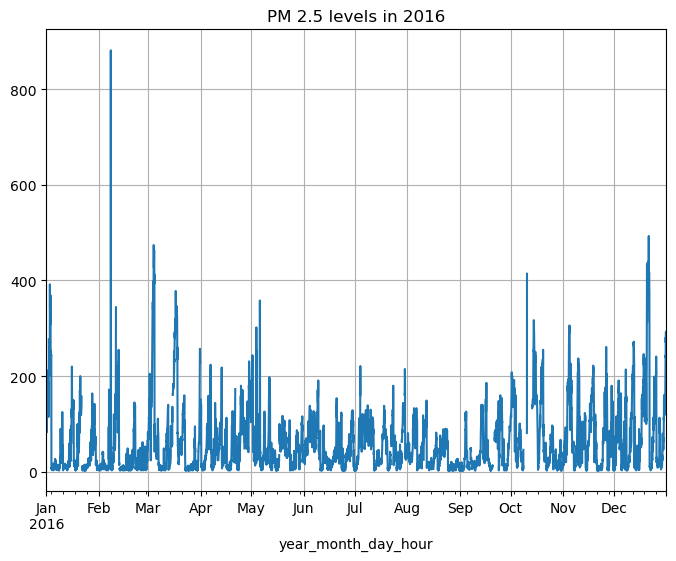

In [22]:
(aq_df['PM2.5'].loc['2016']).plot(grid = True)
plt.title('PM 2.5 levels in 2016')

Text(0.5, 1.0, 'PM 2.5 levels in 2017')

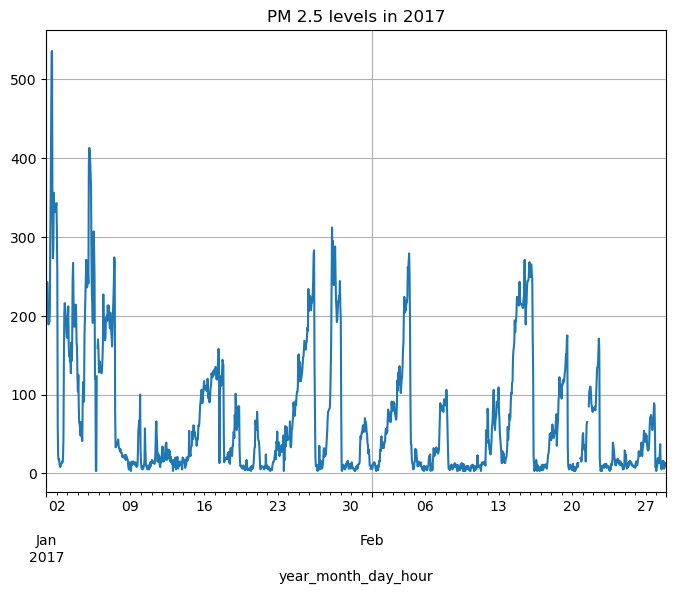

In [23]:
(aq_df['PM2.5'].loc['2017']).plot(grid = True)
plt.title('PM 2.5 levels in 2017')

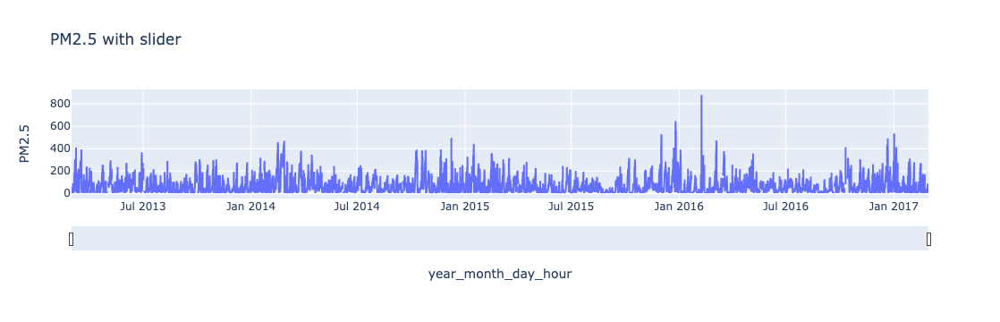

In [24]:
import plotly.express as px
fig = px.line(aq_df_non_indexed, x = 'year_month_day_hour', y = 'PM2.5', title = 'PM2.5 with slider')

fig.update_xaxes(rangeslider_visible = True)
fig.show()

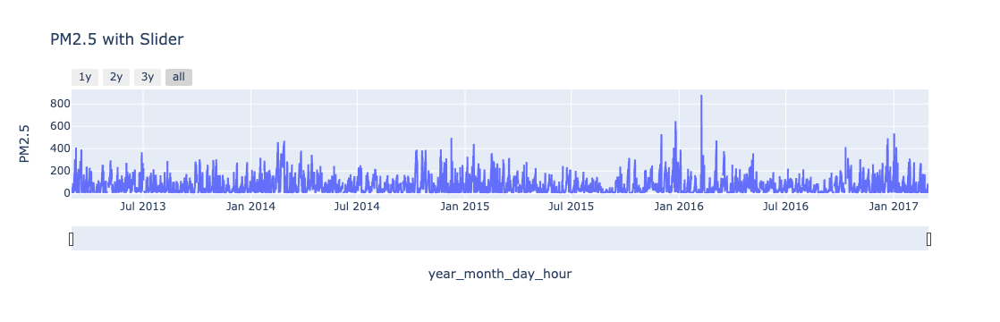

In [27]:
fig = px.line(aq_df_non_indexed, x = 'year_month_day_hour', y='PM2.5', title='PM2.5 with Slider')

fig.update_xaxes(
    rangeslider_visible = True, 
    rangeselector = dict(
        buttons = list([
            dict(count = 1, label = '1y', step = 'year'),
            dict(count = 2, label = '2y', step = 'year'),
            dict(count = 3, label = '3y', step = 'year'),
            dict(step = "all")
        ])
    )
)

fig.show()

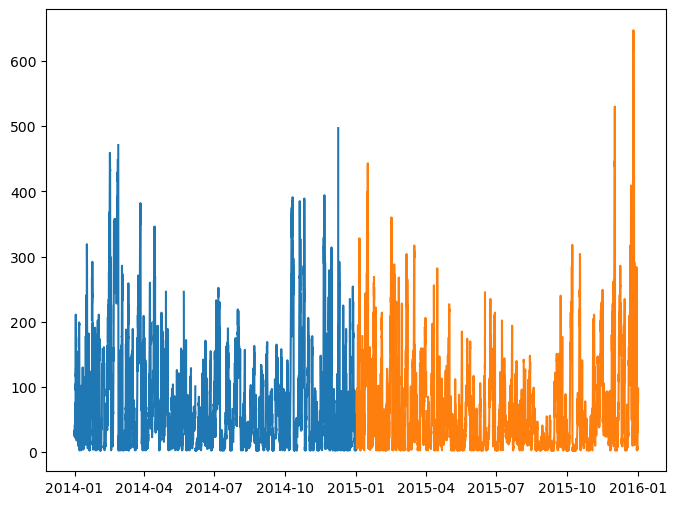

In [37]:
plt.plot(aq_df['PM2.5'].loc['2014'])
plt.plot(aq_df['PM2.5'].loc['2015'])

In [38]:
aq_df['PM2.5'].loc['2014']

year_month_day_hour
2014-01-01 00:00:00    27.0
2014-01-01 01:00:00    25.0
2014-01-01 02:00:00    27.0
2014-01-01 03:00:00    34.0
2014-01-01 04:00:00    32.0
                       ... 
2014-12-31 19:00:00     7.0
2014-12-31 20:00:00     NaN
2014-12-31 21:00:00     NaN
2014-12-31 22:00:00     NaN
2014-12-31 23:00:00     NaN
Name: PM2.5, Length: 8760, dtype: float64

#### Here, looking at two years for each month by utilizing the month and day feature.

Note if we just use `plt.plot(aq_df['PM2.5'].loc['2014'])` and `plt.plot(aq_df['PM2.5'].loc['2015'])`, then the plot would have different x-axis

Text(0.5, 1.0, 'Air Quality plot for the year 2014 and 2015')

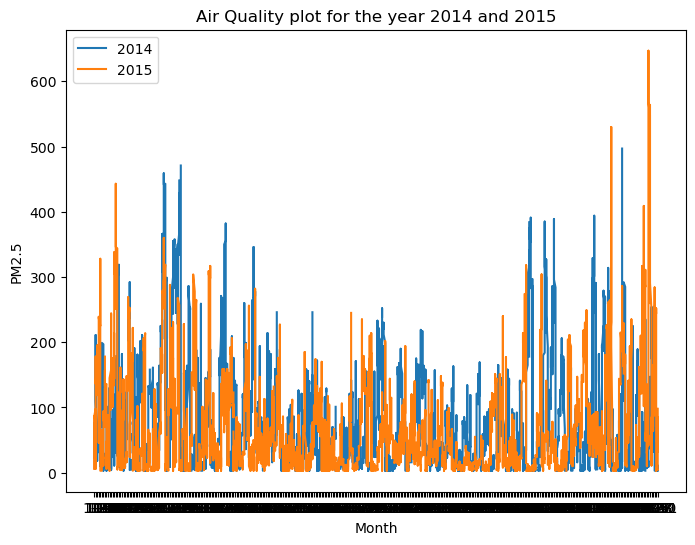

In [62]:
df_2014 = aq_df.loc['2014'].reset_index()
df_2015 = aq_df.loc['2015'].reset_index()

df_2014['month_day'] = df_2014.apply(lambda x : str(x['month']) + "-" + str(x['day']), axis = 1)
df_2015['month_day'] = df_2015.apply(lambda x : str(x['month']) + "-" + str(x['day']), axis = 1)

plt.plot(df_2014['month_day'], df_2014['PM2.5'])
plt.plot(df_2015['month_day'], df_2015['PM2.5'])
plt.legend(['2014', '2015'])
plt.xlabel('Month')
plt.ylabel('PM2.5')
plt.title('Air Quality plot for the year 2014 and 2015')

In [71]:
aq_df.loc['2014' : '2016'][['month', 'PM2.5']].groupby('month').describe()

PM2.5                                                       
        count       mean         std  min   25%   50%     75%    max
month                                                               
1      2173.0  70.285274   75.913587  3.0  12.0  38.0  113.00  443.0
2      1978.0  86.389282  105.603069  3.0  10.0  33.0  132.00  881.0
3      2212.0  80.193852   87.889440  3.0  13.0  47.0  123.25  474.0
4      2105.0  67.963325   56.430235  3.0  25.0  54.0   95.00  346.0
5      2188.0  47.994378   44.843130  3.0  16.0  35.0   67.00  358.0
6      2119.0  46.655403   43.877349  3.0  13.0  31.0   69.00  245.0
7      2205.0  61.671474   50.926149  3.0  21.0  48.0   91.00  252.0
8      2206.0  41.364869   37.279312  3.0  13.0  29.0   60.00  217.0
9      2074.0  45.356123   43.235331  3.0  11.0  27.0   78.00  240.0
10     2081.0  82.586257   92.234361  3.0  13.0  43.0  124.00  414.0
11     2141.0  77.500140   71.720648  3.0  20.0  56.0  112.00  394.0
12     2186.0  87.990851  104.677021  3.0  11.0  48.5  135.00  647.0

In [77]:
aq_df.loc['2014' : '2016'][['month', 'PM2.5', 'TEMP']].groupby('month').agg({'PM2.5' : ['min','max'], 'TEMP' : ['min', 'max']})

PM2.5         TEMP      
        min    max   min   max
month                         
1       3.0  443.0 -16.6  12.4
2       3.0  881.0 -10.9  14.0
3       3.0  474.0  -6.4  26.0
4       3.0  346.0   1.3  32.0
5       3.0  358.0   7.0  41.4
6       3.0  245.0  15.1  38.1
7       3.0  252.0  16.8  39.2
8       3.0  217.0  16.6  36.3
9       3.0  240.0   7.8  34.5
10      3.0  414.0  -1.4  28.1
11      3.0  394.0 -10.3  20.8
12      3.0  647.0  -9.7  11.6

array([<Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>], dtype=object)

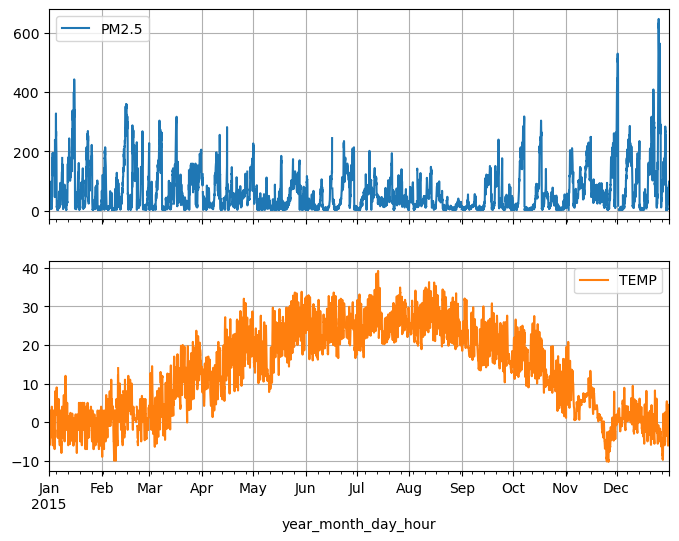

In [86]:
aq_df[aq_df['year'] == '2015'][['PM2.5', 'TEMP']].plot(subplots = True, grid = True)

array([[<Axes: title={'center': 'PM2.5'}>,
        <Axes: title={'center': 'TEMP'}>]], dtype=object)

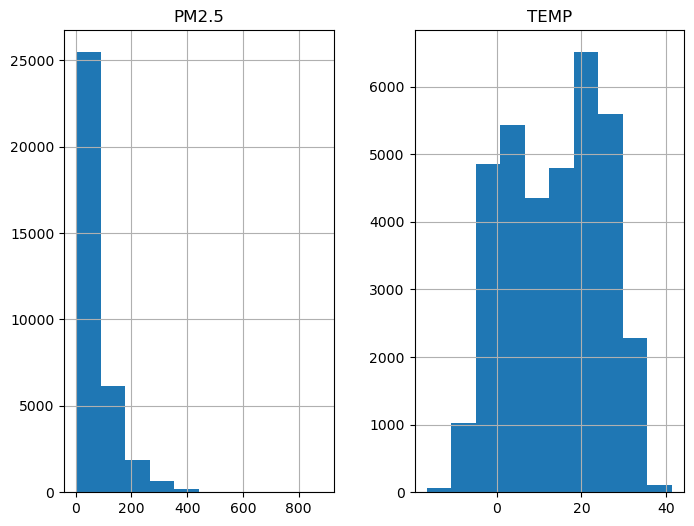

In [87]:
aq_df[['PM2.5', 'TEMP']].hist()

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

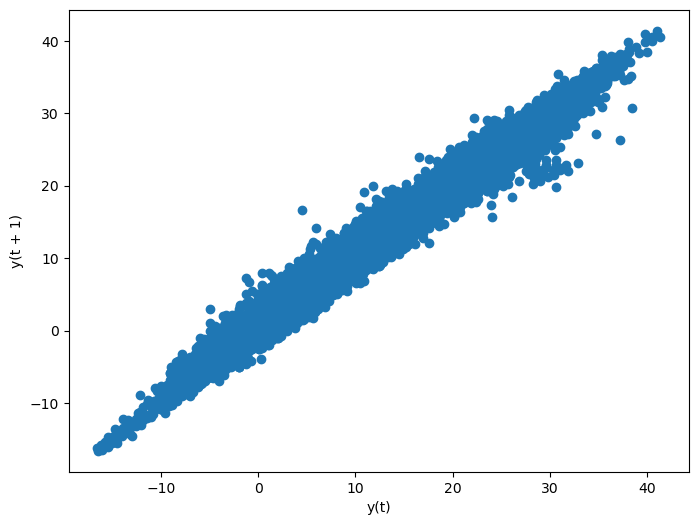

In [95]:
pd.plotting.lag_plot(aq_df['TEMP'], lag=1)

<Axes: xlabel='y(t)', ylabel='y(t + 24)'>

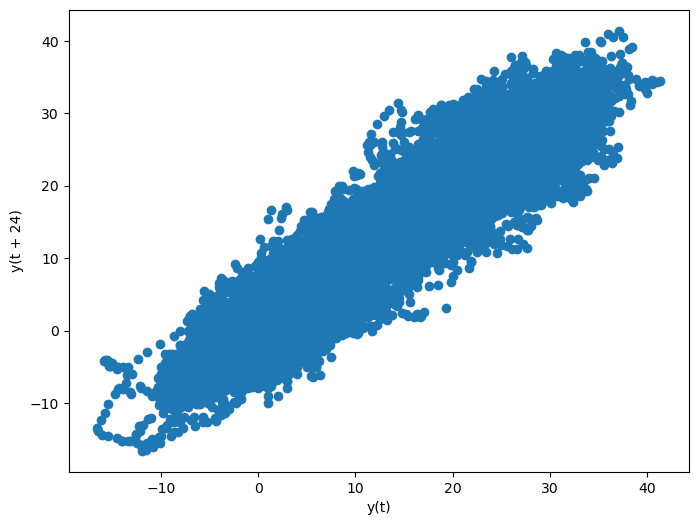

In [97]:
pd.plotting.lag_plot(aq_df['TEMP'], lag=24)

<Axes: xlabel='y(t)', ylabel='y(t + 8760)'>

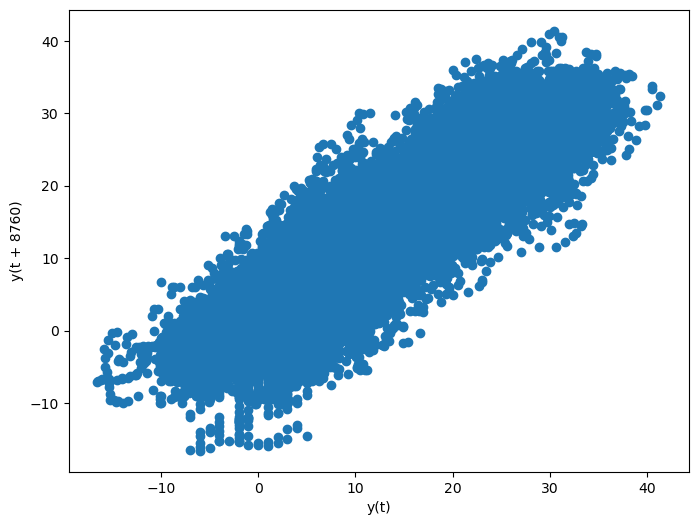

In [105]:
pd.plotting.lag_plot(aq_df['TEMP'], lag=8760) 
# lag based on 1 year, 365*24

<Axes: xlabel='y(t)', ylabel='y(t + 4380)'>

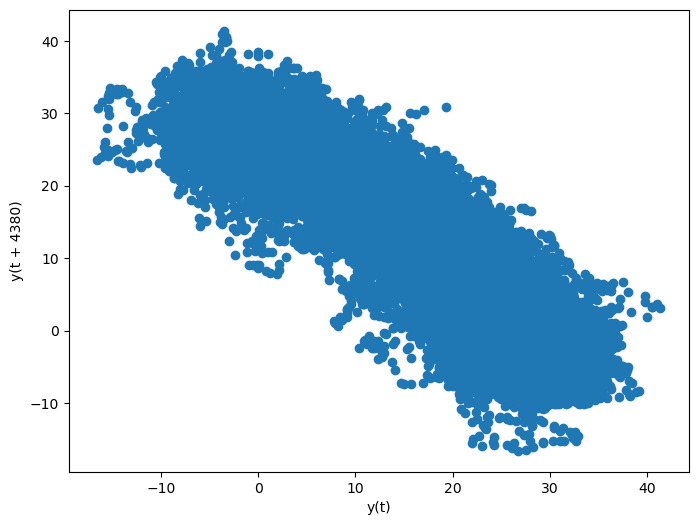

In [104]:
pd.plotting.lag_plot(aq_df['TEMP'], lag=4380)
# THIS IS FIRST HALF YEAR, SO SUMMER AND WINTER 

<Axes: xlabel='y(t)', ylabel='y(t + 2150)'>

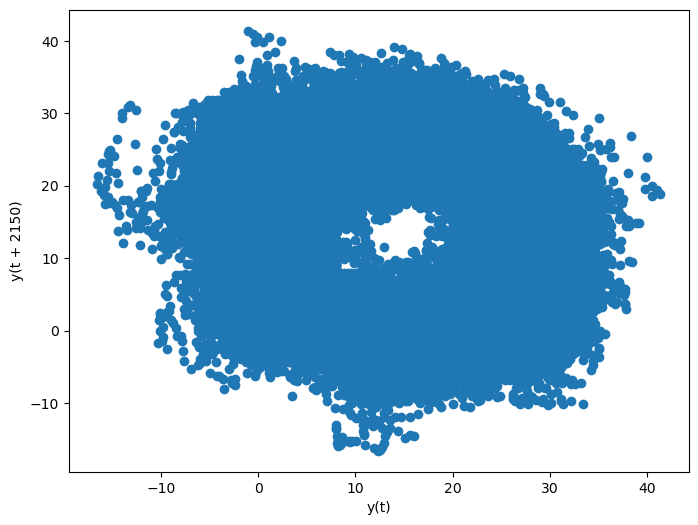

In [106]:
pd.plotting.lag_plot(aq_df['TEMP'], lag=2150)
# THIS IS FIRST 3 MONTHS, WHERE WE HAVE SAME WEATHER -- SO NO CORRELATION AT ALL

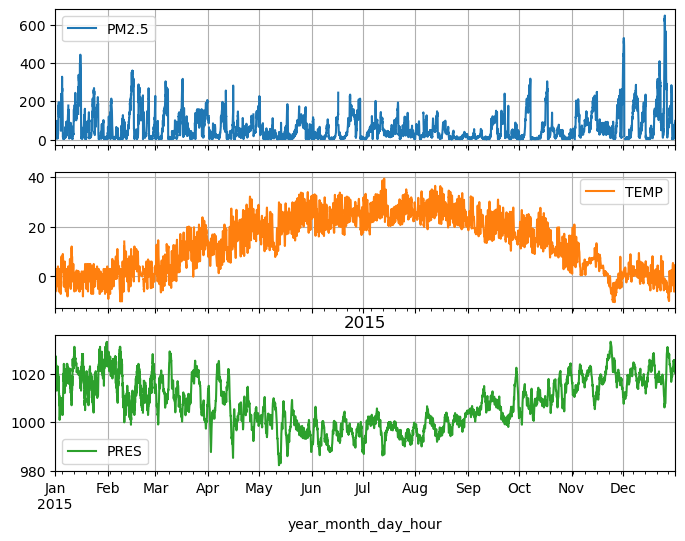

In [109]:
aq_df[aq_df['year'] == '2015'][['PM2.5', 'TEMP', 'PRES']].plot(subplots = True, grid = True)
plt.title('2015')
plt.show()

array([<Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>], dtype=object)

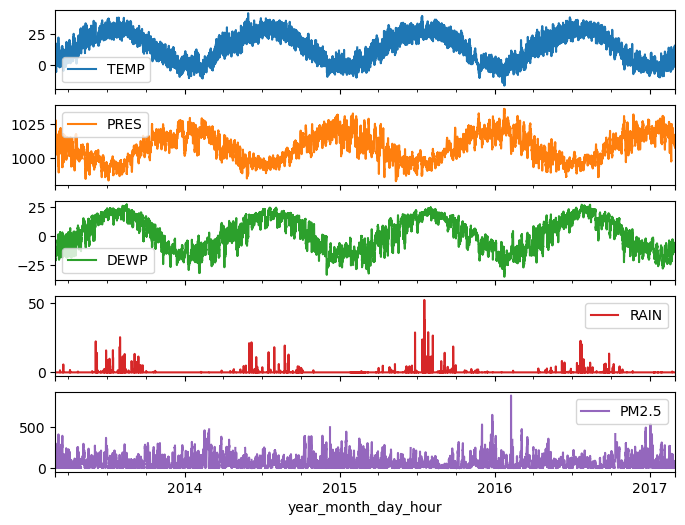

In [110]:
aq_df[['TEMP','PRES','DEWP', 'RAIN','PM2.5']].plot(subplots = True)

array([<Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>], dtype=object)

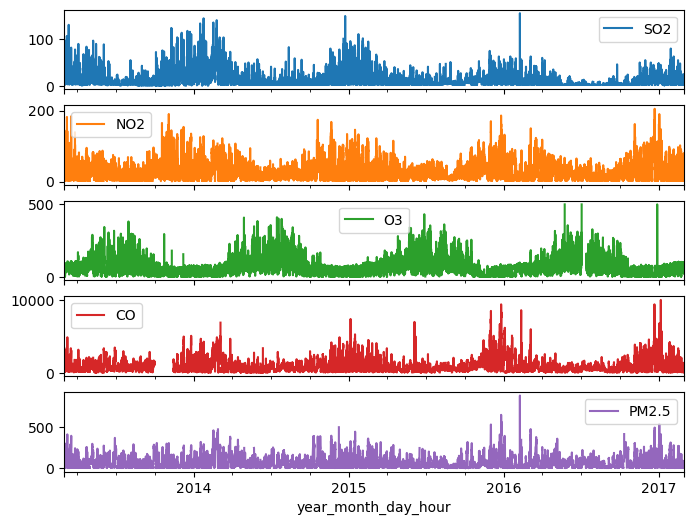

In [111]:
aq_df[['SO2','NO2','O3', 'CO','PM2.5']].plot(subplots=True)

/Users/pragya/miniconda3/envs/hands_on_ml/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



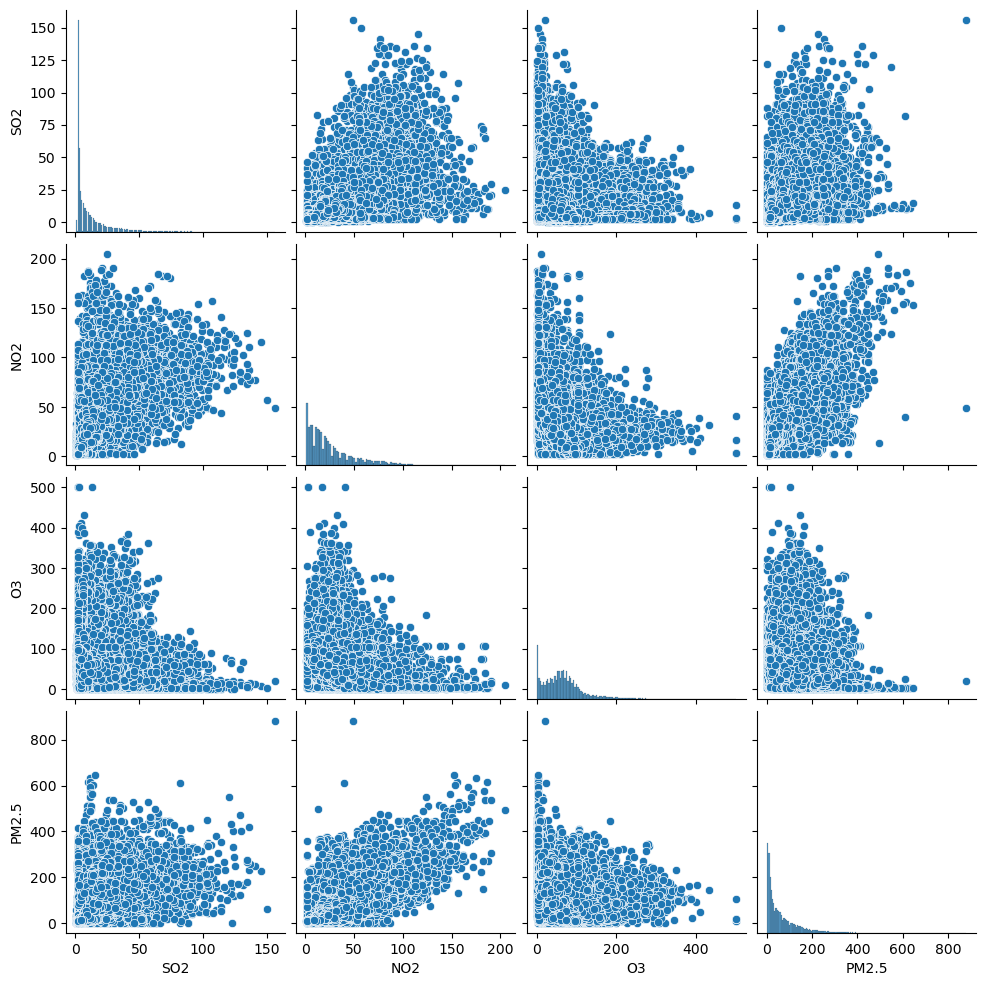

In [113]:
g = sns.pairplot(aq_df[['SO2','NO2','O3','PM2.5']])

In [116]:
aq_corr = aq_df[['SO2','NO2','O3', 'CO','PM2.5']].corr(method='pearson')
aq_corr

,SO2,NO2,O3,CO,PM2.5
SO2,1.000000,0.610433,-0.182096,0.529182,0.475117
NO2,0.610433,1.000000,-0.373625,0.798753,0.718170
O3,-0.182096,-0.373625,1.000000,-0.303275,-0.100542
CO,0.529182,0.798753,-0.303275,1.000000,0.802737
PM2.5,0.475117,0.718170,-0.100542,0.802737,1.000000


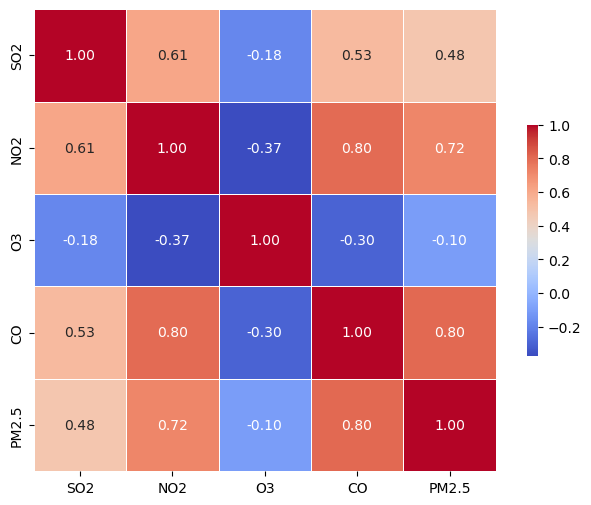

In [121]:
g = sns.heatmap(aq_corr, square = True, linewidth = 0.5, cbar_kws = {'shrink':0.5}, annot = True, fmt = '.2f', cmap = 'coolwarm')

**NOTE: in time-series, one should avoid dropping rows as the ordering is lost. but here, we are just looking at the correlation over whole set**

In [122]:
aq_df_na = aq_df.copy()
aq_df_na=aq_df_na.dropna()

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

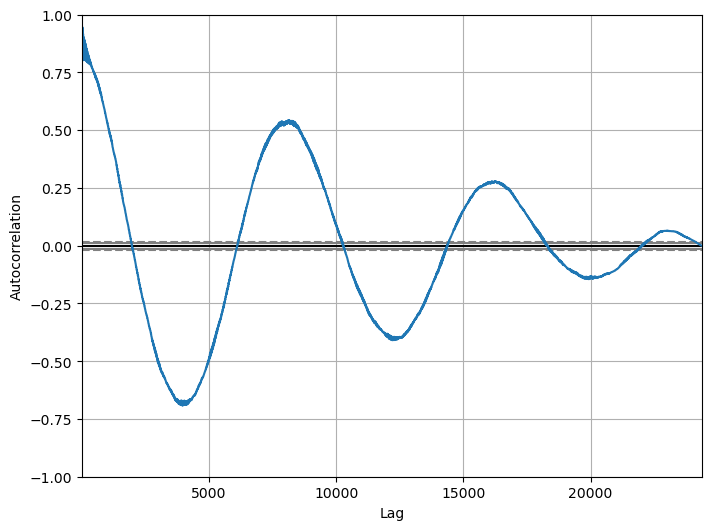

In [123]:
pd.plotting.autocorrelation_plot(aq_df_na.loc['2014':'2016']['TEMP'])

#### Here, lag is the time lagged. we see around 8000, we have a peak again which is roughly 1 year. Lets convert the lag in months to see it clearly)

In [124]:
aq_df_na['TEMP'].resample('1y').mean()

year_month_day_hour
2013-12-31    16.682562
2014-12-31    14.422116
2015-12-31    13.621925
2016-12-31    12.618860
2017-12-31     0.433247
Freq: A-DEC, Name: TEMP, dtype: float64

In [125]:
aq_df_na['TEMP'].resample('1m').mean()

year_month_day_hour
2013-03-31     6.039970
2013-04-30    12.208494
2013-05-31    21.886386
2013-06-30    23.752827
2013-07-31    27.405079
2013-08-31    27.228465
2013-09-30    20.482500
2013-10-31          NaN
2013-11-30     5.434524
2013-12-31     0.896623
2014-01-31     0.023428
2014-02-28    -0.352762
2014-03-31    10.415449
2014-04-30    17.235362
2014-05-31    22.043236
2014-06-30    25.194985
2014-07-31    28.409502
2014-08-31    26.284552
2014-09-30    20.834161
2014-10-31    13.556000
2014-11-30     6.357762
2014-12-31    -0.745582
2015-01-31    -0.590377
2015-02-28     1.572512
2015-03-31     8.707613
2015-04-30    15.566570
2015-05-31    21.300275
2015-06-30    24.636691
2015-07-31    26.228630
2015-08-31    26.135854
2015-09-30    20.392206
2015-10-31    14.387465
2015-11-30     3.358686
2015-12-31    -0.053912
2016-01-31    -4.233428
2016-02-29     1.434441
2016-03-31     8.687006
2016-04-30    16.262014
2016-05-31    20.793142
2016-06-30    25.481977
2016-07-31    25.839

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

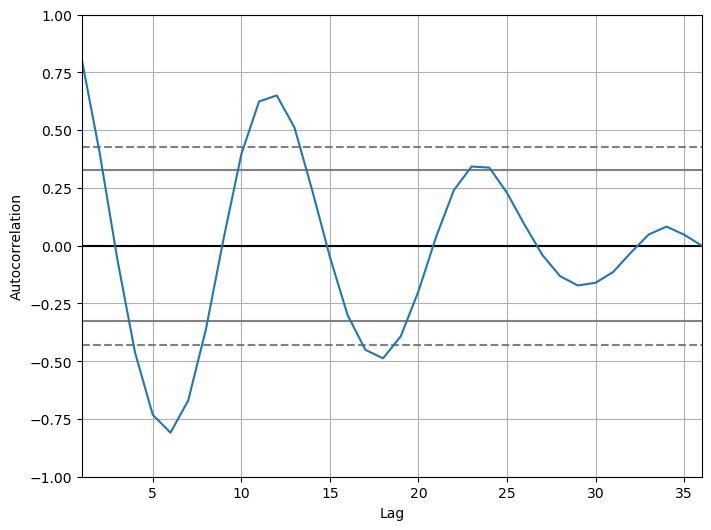

In [126]:
pd.plotting.autocorrelation_plot(aq_df_na.loc['2014':'2016']['TEMP'].resample('1m').mean())